In [162]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import scipy
import librosa, librosa.display
import IPython.display as ipd
from pathlib import Path

from google.colab import drive
drive.mount('/content/drive')

os.getcwd()
os.chdir('/content/drive/MyDrive/Arquivos_para_uso_GoogleColab/Spectro_Extration')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**ZERO CROSSING RATE**

In [163]:
x, sr = librosa.load('bit.wav')

In [164]:
ipd.Audio(x , rate=sr)

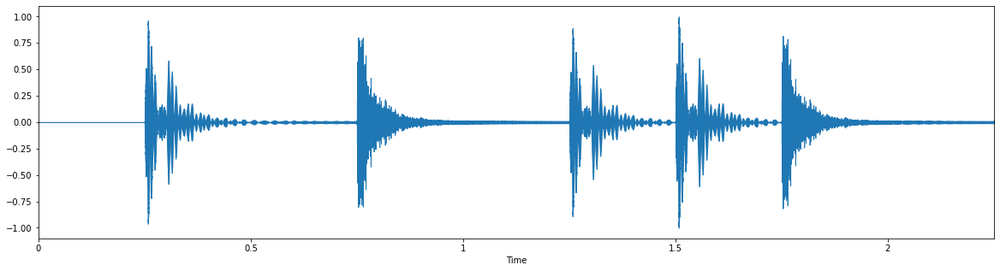

In [165]:
#Vamos exibir o audio em um gráfico para melhor entendimento
plt.figure(figsize=(20,5))
librosa.display.waveplot(x, sr=sr)  

Vamos olhar agora de forma mais objetiva em um intervalo da nossa onda

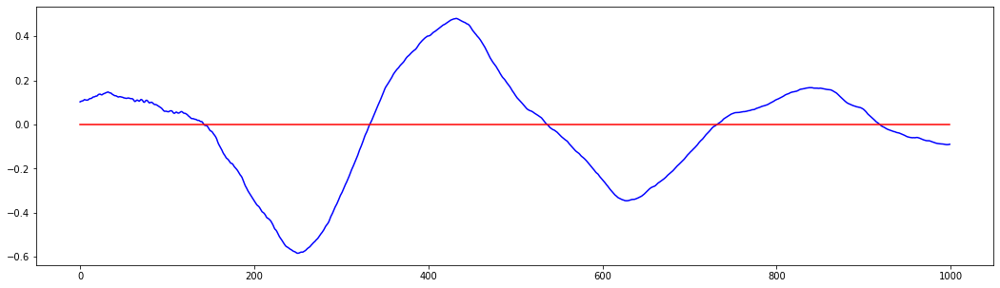

In [166]:
n0 = 6500 #Tempo em ms
n1 = 7500 #Tempo em ms
plt.figure(figsize=(18,5))
plt.plot(x[n0:n1], color='b')
plt.plot(x[n0:n1]*0, color= 'r')

Como podemos ver no nosso gráfico possuimos 5 pontos só nesse intervalo que se encontra com o ponto zero do nosso sistema

In [167]:
from librosa.core.audio import zero_crossings
zero_cross = sum(zero_crossings(x[n0:n1], pad=False)) #Usamos o SUM pois o valor pelo zero_crossing sai com uma mascara nele então somamos para obter o valor esperado

print(zero_cross)

5


In [168]:
#Para sabermos qual é a razão do zero crossing rate pelo tempo é dada por:

zero_cross_time = librosa.feature.zero_crossing_rate(x)
zero_cross_time.shape

(1, 97)

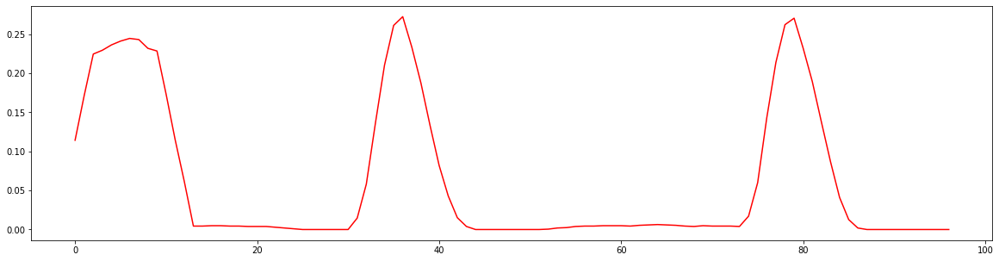

In [169]:
plt.figure(figsize=(20,5))
plt.plot(zero_cross_time[0], color='r')

Como podemos ver temos uma mudança muito grande no começo e nosso audio possui apenas dois tipos de batidas, isso significa que essa mudança é dada pela variação que existe de ruidos durantes as partes de silencios


(-0.0001, 0.0001)

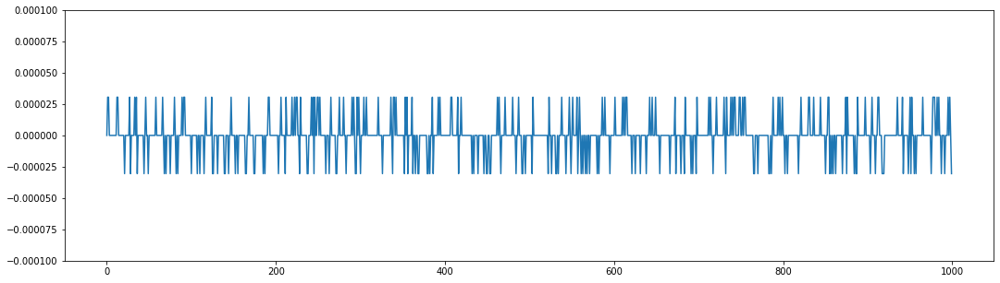

In [170]:
plt.figure(figsize=(18,5))
plt.plot(x[:1000])
plt.ylim(-0.0001, 0.0001)


Uma forma simples de resolvermos isso é simplesmente adicionarmos uma constante que consiga remover essa diferença que entra no calculo do zero_crossing_rate

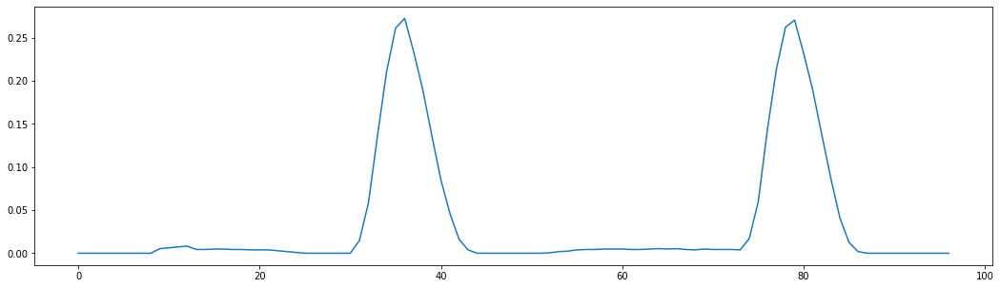

In [171]:
zero_cross_time = librosa.feature.zero_crossing_rate(x + 0.0001)

plt.figure(figsize=(18,5))
plt.plot(zero_cross_time[0])

**EXTRAÇÃO DE DADOS BÁSICOS**

Carregando os arquivos dos audios para extração das informações.



In [172]:
kick_sound = [librosa.load(s)[0] for s in Path().glob('Kick (*).wav')]

snare_sound = [librosa.load(s)[0] for s in Path().glob('Snare (*).wav')]

In [173]:
print(len(kick_sound))
print(len(snare_sound))

5
5


Vamos ver nossos gráficos dos áudios que carregamos

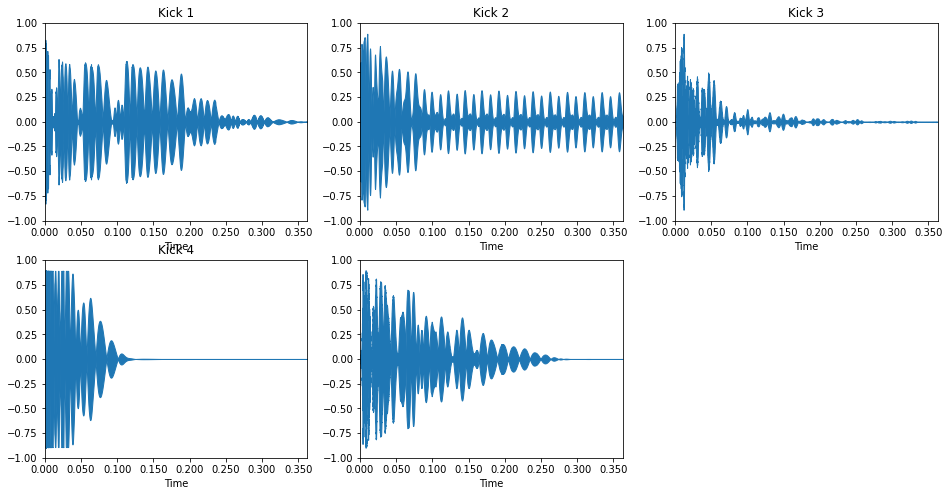

In [174]:
#Kick - Bumbo de bateria - Barulho mais grave
plt.figure(figsize=(16,8))

for i, x in enumerate(kick_sound):
  plt.title('Kick %i' %(i))
  plt.subplot(2, 3, i+1)
  librosa.display.waveplot(x[:8000])
  plt.ylim(-1,1)

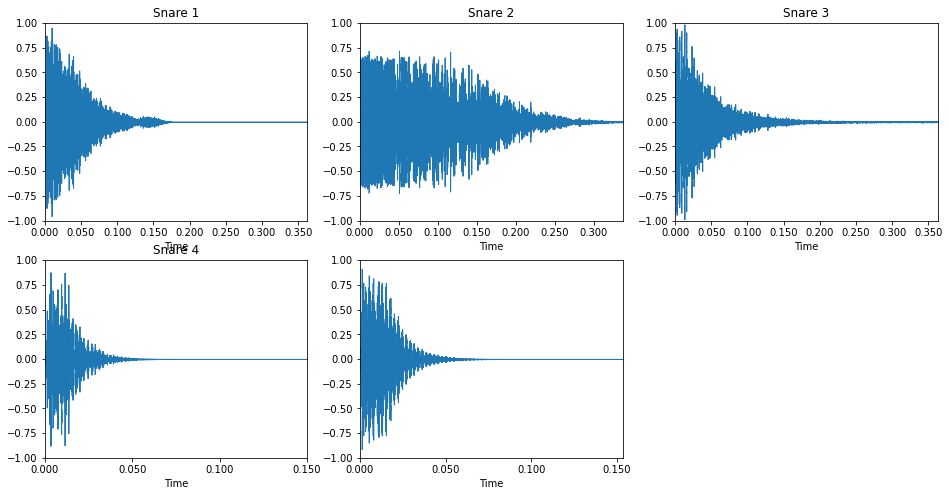

In [175]:
#Snare - Prato de bateria - Barulho mais agudo
plt.figure(figsize=(16,8))

for i, x in enumerate(snare_sound):
  plt.title('Snare %i' %(i))
  plt.subplot(2,3, i+1)
  librosa.display.waveplot(x[:8000])
  plt.ylim(-1,1)

Vamos agora construir uma função que vai nos auxiliar na extração de dados. Essa função pegará valores e transformará em vetores.


In [176]:
def vectorize_values(sound):
  return [librosa.feature.zero_crossing_rate(sound)[0,0],
          librosa.feature.spectral_centroid(sound)[0,0]]

In [177]:
vec_kick_sound = np.array([vectorize_values(x) for x in kick_sound])
vec_snare_sound = np.array([vectorize_values(x) for x in snare_sound])

Vamos ver como está dividida nossa 'Zero Crossing Rate', que será a 'frequencia' que nossa onda passa pelo zero do gráfico

Text(0, 0.5, 'Count')

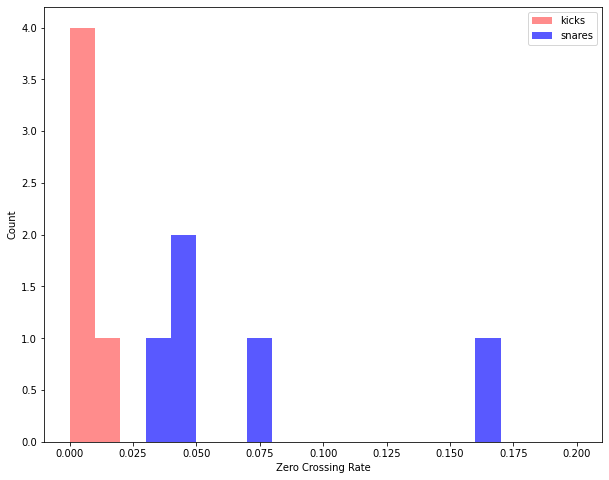

In [178]:
plt.figure(figsize=(10,8))
plt.hist(vec_kick_sound[:,0], color='r', range=(0, 0.2), alpha=0.45, bins=20)
plt.hist(vec_snare_sound[:,0], color='b', range=(0, 0.2), alpha=0.65, bins=20)
plt.legend(('kicks', 'snares'))
plt.xlabel('Zero Crossing Rate')
plt.ylabel('Count')

Vamos ver agora como ficou nosso 'Spectral Centroid', indica o centro de 'massa' do nosso áudio.

Text(0, 0.5, 'Count')

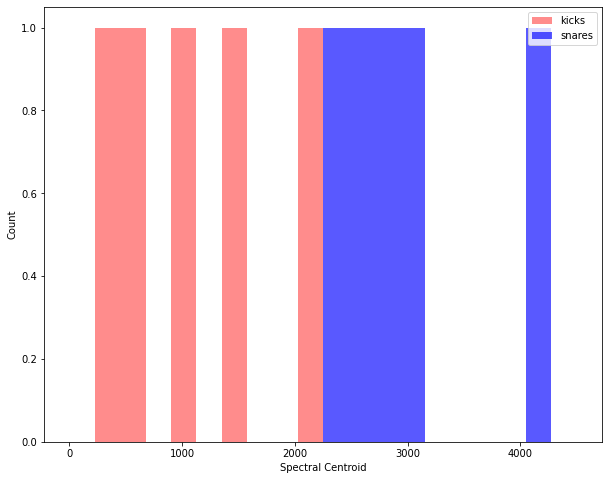

In [179]:
plt.figure(figsize=(10,8))
plt.hist(vec_kick_sound[:,1], color='r', range=(0, 4500), alpha=0.45, bins=20)
plt.hist(vec_snare_sound[:,1], color='b', range=(0, 4500), alpha=0.65, bins=20)
plt.legend(('kicks', 'snares'))
plt.xlabel('Spectral Centroid')
plt.ylabel('Count')

Agora vamos usar um método de normalização para evitarmos de ter problemas futuros quando precisar utilizar os valores em ML


In [180]:
import sklearn

#Vamos juntar todas as informações que temos dentro de uma unica tabela

feature_table = np.vstack((vec_kick_sound, vec_snare_sound))
print(feature_table.shape)

scale = sklearn.preprocessing.MinMaxScaler(feature_range=(-1,1))

feature_training = scale.fit_transform(feature_table)
print(feature_training.min(axis=0))
print(feature_training.max(axis=0))

(10, 2)
[-1. -1.]
[1. 1.]


Plotando o gráfico com os resultados obtidos

Text(0, 0.5, 'Spectral Centroid')

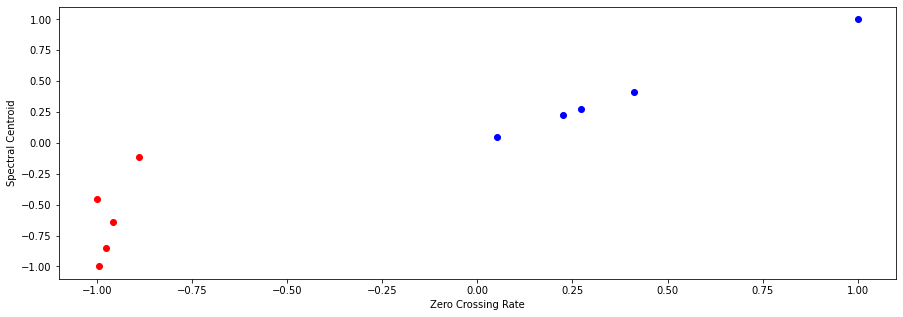

In [181]:
plt.figure(figsize=(15,5))

plt.scatter(feature_training[:5,0], feature_training[:5,1], color='r')
plt.scatter(feature_training[5:,1], feature_training[5:,1], color='b')
plt.xlabel('Zero Crossing Rate')
plt.ylabel('Spectral Centroid')

**Segmentação e Energia com RMS**

Vamos setar alguns parametros para a segmentação. Primeiro vamos determinar um intervalo de 3s para cada intervalo e vamos também setar nosso Herts para 22500

In [182]:
T = 3
sr = 22500
amplitude = np.logspace(-3,0,int(T*sr), False)
print(amplitude.min(), amplitude.max())

0.001 0.9998976681210201


In [183]:
#Criando um audio com esses parametros

t = np.linspace(0, T, int(T*sr), False)
x = amplitude*np.sin(2*np.pi*420*t)

In [184]:
ipd.Audio(x, rate= sr)

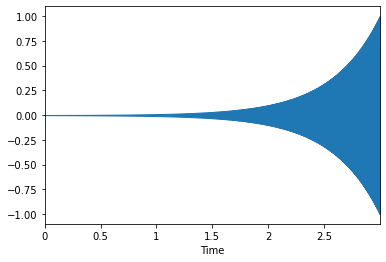

In [185]:
#Vamos pegar e plotar esse audio

librosa.display.waveplot(x, sr=sr)

In [186]:
x, sr = librosa.load('bit.wav')

In [187]:
print(x.shape, sr)

(49613,) 22050


In [188]:
librosa.get_duration(x, sr)

2.2500226757369615

In [189]:
ipd.Audio(x, rate=sr)

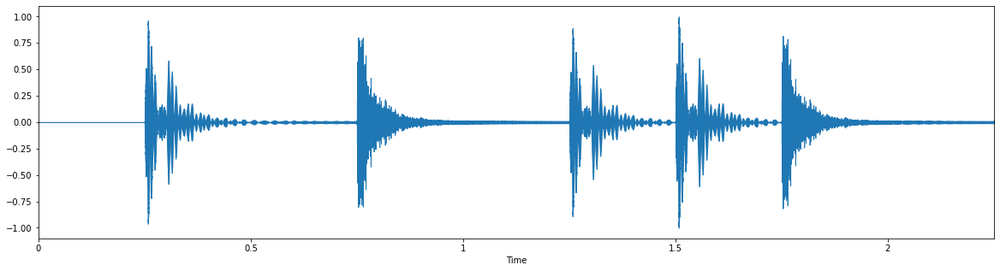

In [190]:
plt.figure(figsize=(20,5))
librosa.display.waveplot(x, sr=sr)

In [191]:
#Contabilizando a energia, para isso iremos colocar dois parametros o primeiro indica a porção do nosso audio (hop_length) 
#e a segunda o comprimento do audio que queremos (frames do audio) (frames_length)

hop_length = 256
frame_length = 512

energy = np.array(
    [sum(abs(x[i:i+frame_length]**2))
    for i in range(0, len(x), hop_length)
    ])

In [192]:
energy.shape

(194,)

Computando o RMS

In [193]:
rms = librosa.feature.rms(x, frame_length=frame_length, hop_length=hop_length, center=True)
rms.shape

rms = rms[0]

Vamos agora plotar juntamente com a onda do som os valores da energia e do RMS

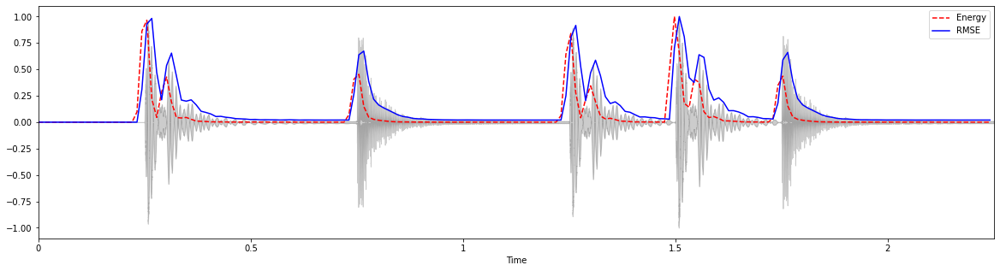

In [194]:
t = librosa.frames_to_time(range(len(energy)), sr=sr,hop_length=hop_length)

plt.figure(figsize=(20,5))
librosa.display.waveplot(x, sr=sr, alpha=0.2, color = 'black')
plt.plot(t, energy/energy.max(), 'r--', alpha = 1)
plt.plot(t[:len(rms)], rms/rms.max(), color = 'b', alpha=1)
plt.legend(('Energy', 'RMSE'))

**Serie de Fourier e Espectrograma**

In [195]:
x, sr = librosa.load('Guitar 2.wav')

In [196]:
ipd.Audio(x, rate=sr)

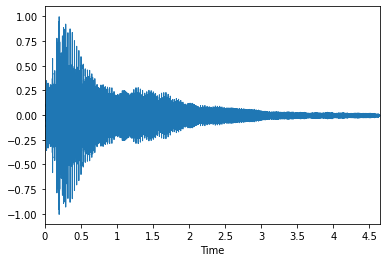

In [197]:
librosa.display.waveplot(x, sr=sr)

Vamos começar agora a parte de utilização da transformação de fourier que nada mais é que transformar nosso audio da relação de tempo para frequencias vamos usar a scipy.fft (Fast Fourier Transform)

In [198]:
X = scipy.fft.ifft(x)
X_mag = np.absolute(X)
f = np.linspace(0, sr, len(X_mag))

Text(0.5, 0, 'Frequency (Hz)')

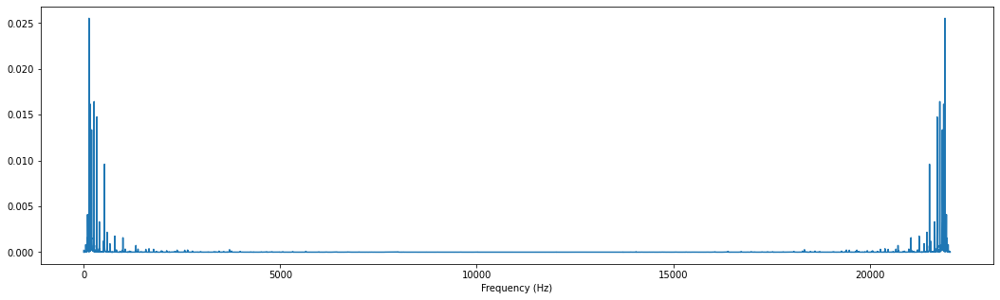

In [199]:
plt.figure(figsize=(18,5))
plt.plot(f, X_mag)
plt.xlabel('Frequency (Hz)')

Text(0.5, 0, 'Frequency (Hz)')

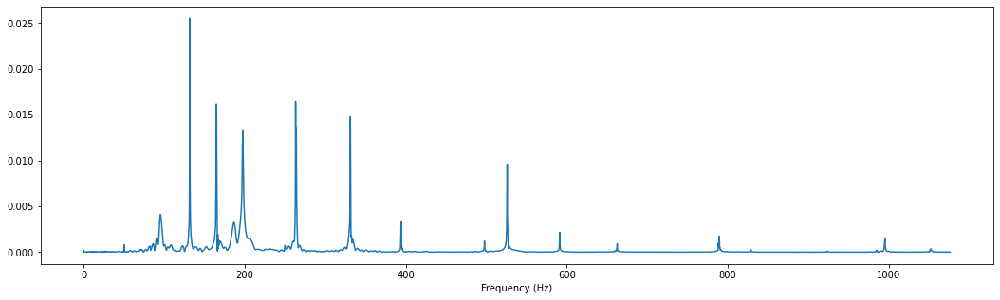

In [200]:
#Vamos dar um zoom no nosso gráfico.
plt.figure(figsize=(18,5))
plt.plot(f[:5000], X_mag[:5000])
plt.xlabel('Frequency (Hz)')

In [201]:
x, sr = librosa.load('Oh chuva.wav')

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [202]:
ipd.Audio(x, rate=sr)

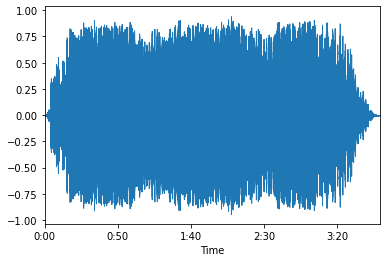

In [203]:
librosa.display.waveplot(x,sr=sr)

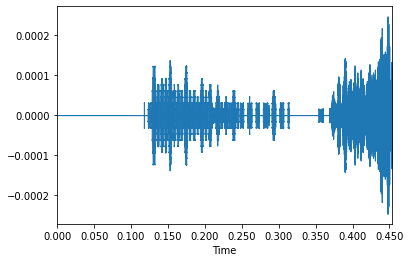

In [204]:
librosa.display.waveplot(x[:10000],sr=sr)

In [205]:
#Vamos agora proceguir com a parte de Short-Time Fourier Transform usando a biblioteca librosa

hop_ = 1024
n_fft = 1024

Y = librosa.stft(x, n_fft=n_fft, hop_length= hop_)

In [206]:
#Hop_length para segundos
float(hop_)/sr

0.046439909297052155

In [207]:
#Frame_size para segundos
float(n_fft)/sr

0.046439909297052155

In [208]:
Y.shape
#Logo temos 513 intervalos de frequencia e 4936 frames nesses tempos(pelo oque eu entendi )

(513, 4936)

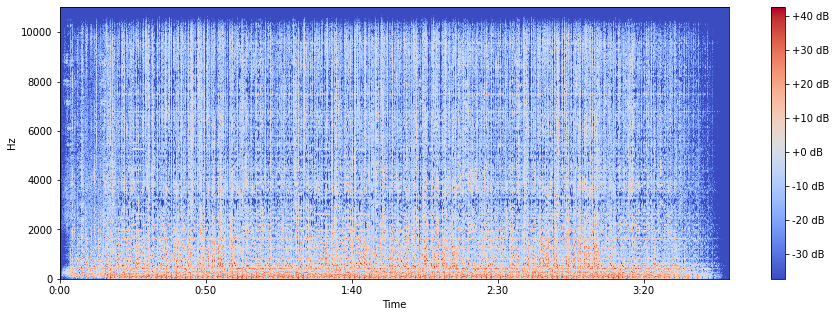

In [209]:
#Vamos primeiro converter nosso amplitude para Db

S = librosa.amplitude_to_db(abs(Y))

plt.figure(figsize=(15,5))
librosa.display.specshow(S, sr=sr, hop_length=hop_, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')

**Pitch e Chromas**

In [210]:
x, sr = librosa.load('piano.wav')

In [211]:
ipd.Audio(x, rate=sr)

In [212]:
fmin = librosa.midi_to_hz(36)

hop_len = 1024

val = librosa.cqt(x, sr=sr, hop_length=hop_len, fmin=fmin,n_bins = 84)

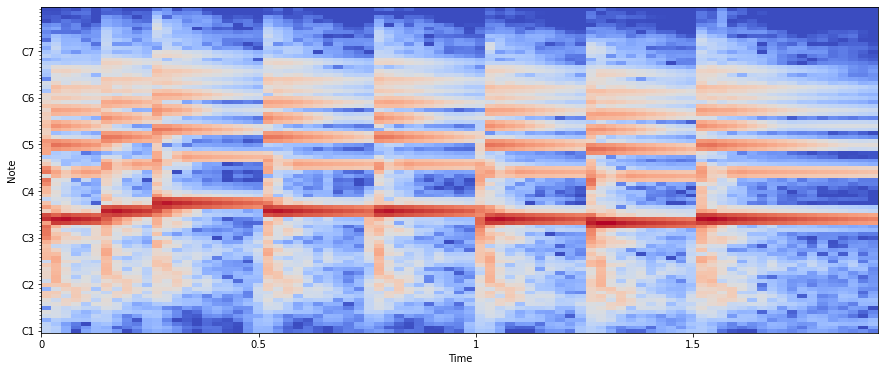

In [213]:
log_c = librosa.amplitude_to_db(abs(val))

plt.figure(figsize=(15,6))
librosa.display.specshow(log_c, sr=sr, x_axis='time', y_axis='cqt_note')

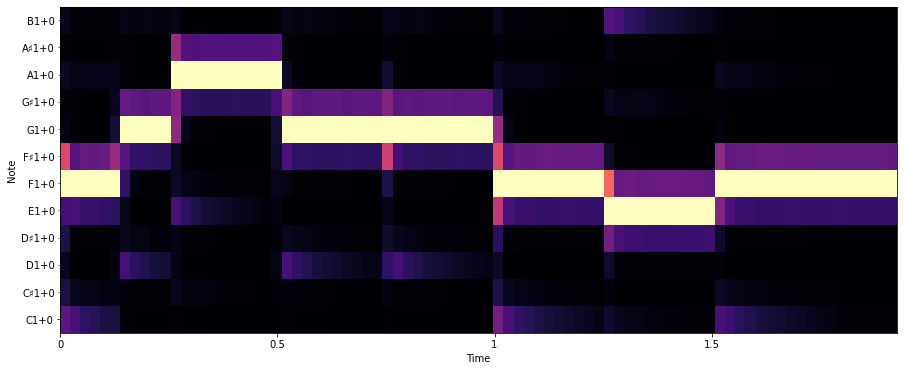

In [214]:
chroma = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_len)
plt.figure(figsize=(15,6))
librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='cqt_note')

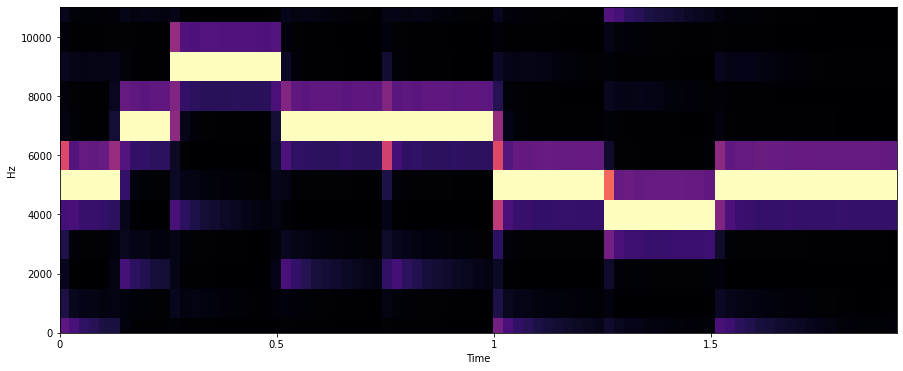

In [215]:
chroma = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_len)
plt.figure(figsize=(15,6))
librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='linear')